# Classification of COVID-19 chest X-rays with deep learning

In [1]:
from fastai.vision.all import *

## Dataset download and augmentatioon
Download [dataset from Kaggle](https://www.kaggle.com/tawsifurrahman/covid19-radiography-database "COVID-19 Radiography Database") and extract in current directory.

In [2]:
augs = [RandomResizedCropGPU(size=224, min_scale=0.75), Rotate(), Zoom()]
radiography_blocks = DataBlock(blocks=(ImageBlock, CategoryBlock),
                              get_items=get_image_files,
                              splitter=RandomSplitter(),
                              get_y = parent_label,
                              item_tfms=Resize(512, method="squish"),
                              batch_tfms=augs)

In [3]:
dls = radiography_blocks.dataloaders("COVID-19 Radiography Database", bs=128)

## Sample dataset images

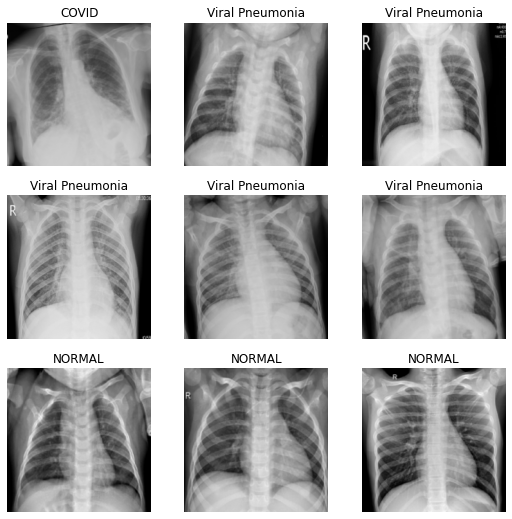

In [4]:
dls.show_batch()

## Transfer learning on pre-trained ResNet18

In [5]:
learn = cnn_learner(dls, resnet18, opt_func=ranger, loss_func=CrossEntropyLossFlat(), metrics = accuracy).to_fp16()

## Learning rate finder (Freezed body)

/home/gurucharan/anaconda3/envs/fastai/lib/python3.7/site-packages/fastai/learner.py:53: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")


SuggestedLRs(lr_min=0.04365158379077912, lr_steep=0.0030199517495930195)

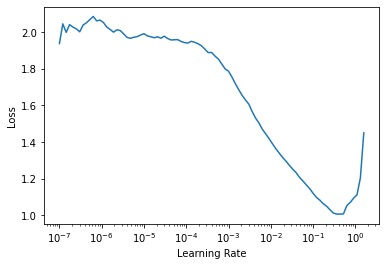

In [6]:
learn.lr_find()

## Train the head for 4 epochs

In [7]:
learn.fit_one_cycle(4, 5e-2)

epoch,train_loss,valid_loss,accuracy,time
0,0.528269,0.626474,0.877735,00:25
1,0.322053,0.402455,0.920206,00:24
2,0.208753,0.210839,0.947233,00:24
3,0.154316,0.117676,0.953668,00:25


## Unfreeze the model for finetuning

In [8]:
learn.unfreeze()

## Learning rate finder (Unfreezed model)

SuggestedLRs(lr_min=0.00012022644514217973, lr_steep=6.309573450380412e-07)

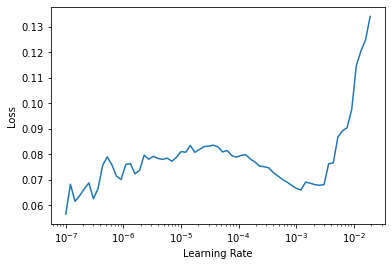

In [9]:
learn.lr_find()

## Finetune the model

In [10]:
learn.fit_one_cycle(4, slice(5e-6, 5e-5))

epoch,train_loss,valid_loss,accuracy,time
0,0.076858,0.149585,0.956242,00:25
1,0.078321,0.116312,0.957529,00:26
2,0.081421,0.138235,0.958816,00:25
3,0.071128,0.116193,0.961390,00:25


## Model interpretation (Confusion matrix and Top losses)

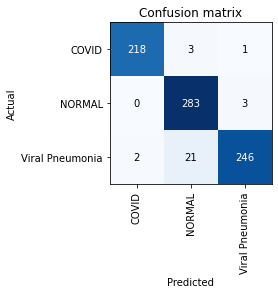

In [11]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

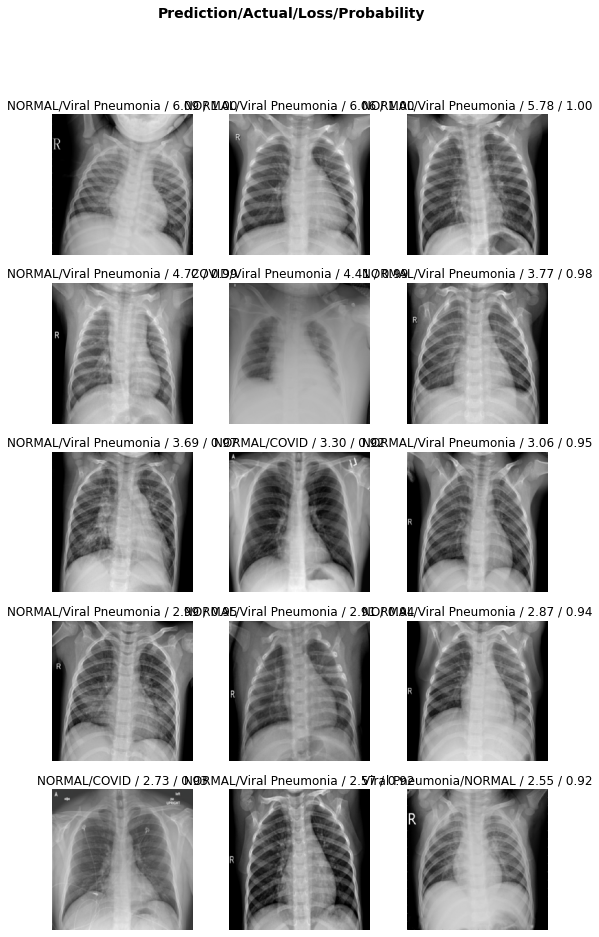

In [12]:
interp.plot_top_losses(15, nrows=5)

## Explainability

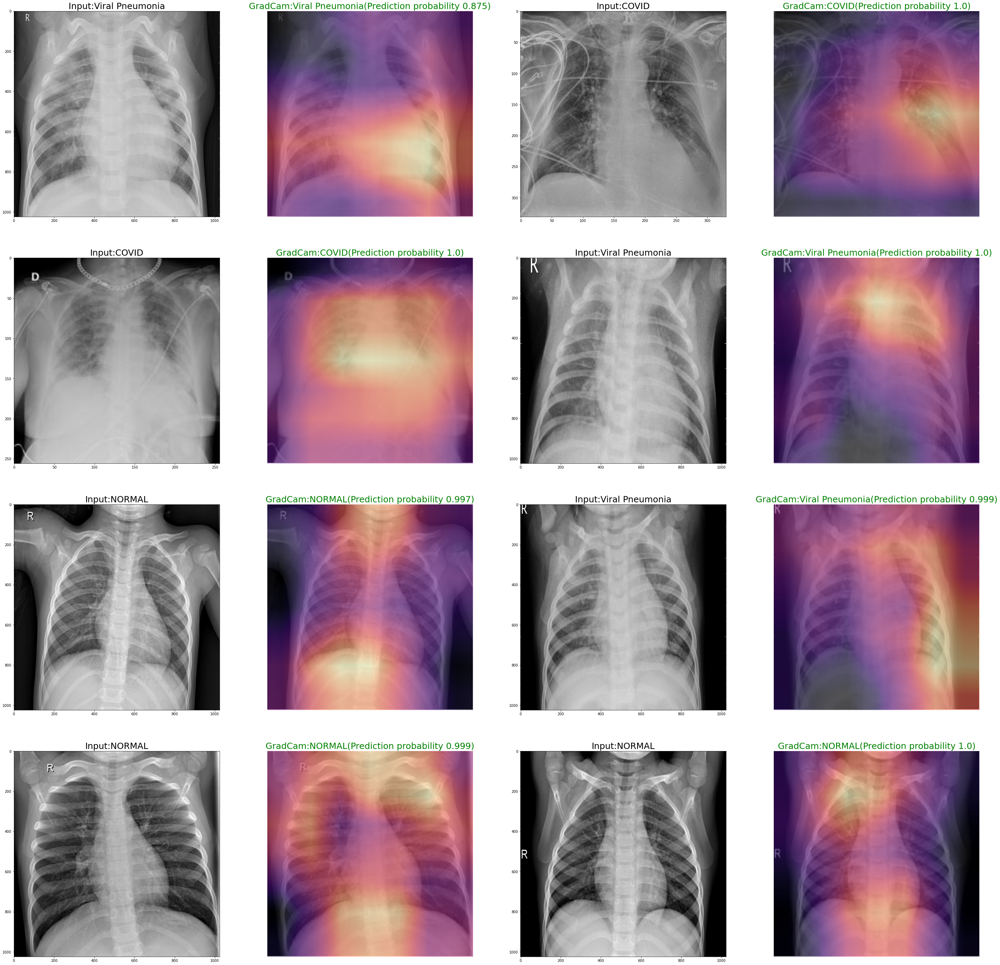

In [13]:
from gradcam import plot_gradcam
plot_gradcam(learn)

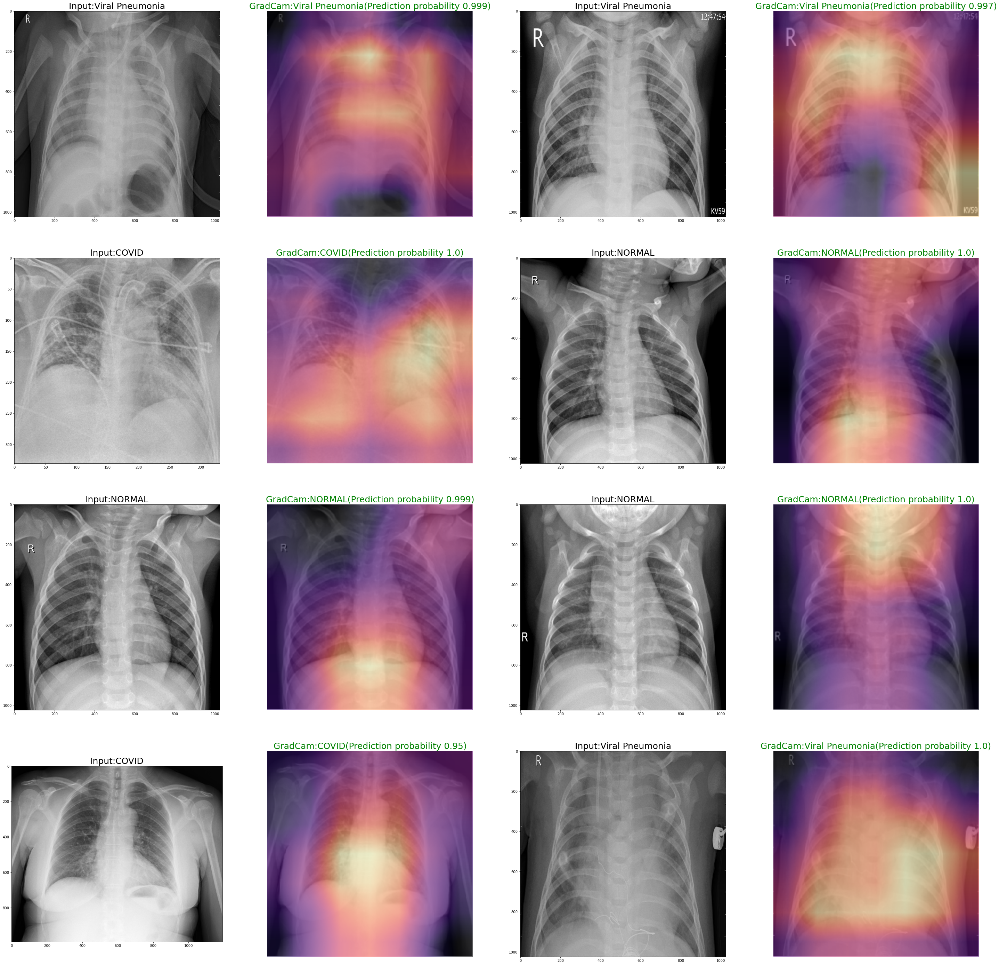

In [14]:
plot_gradcam(learn)